In [3]:
!pip install svgpathtools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.3/68.3 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 kB 5.3 MB/s eta 0:00:00


Lengths of SVG paths: [2205.043324206443, 3890.708905078277, 1054.8665786096867, 1055.3101410296103, 1052.9476854449704, 418.5971569474379, 418.53200612465093, 419.017554295321, 315.5300008658898, 434.33883454450466, 474.01577468462756, 319.5390632173926, 347.83590825016324, 352.1429897425849, 319.17820757587407, 316.8304079360532, 155.32099671598954, 152.42081453870077, 319.86444625198936, 340.8259100386711, 131.7094033482983, 203.21127573476494, 92.45747705893329, 92.58795999774645, 92.1381359547083, 265.0099876093083, 204.4759368191807, 209.0911199727579, 194.83752216710133, 120.2424615125427, 116.36040963040801, 116.39753216177621, 123.08741601637443, 120.74797929053103, 167.2788840203951, 169.72895156748402, 143.4869565976667, 148.1312080699644, 142.88621877799318, 155.83093164452305, 143.06301468368318, 146.0051316362598, 144.94539167144947, 145.0239847221699, 99.20063421846086, 132.38247731052476, 122.40449874476225, 62.743864696749775, 61.92335571531398, 61.36262341717559, 60.9

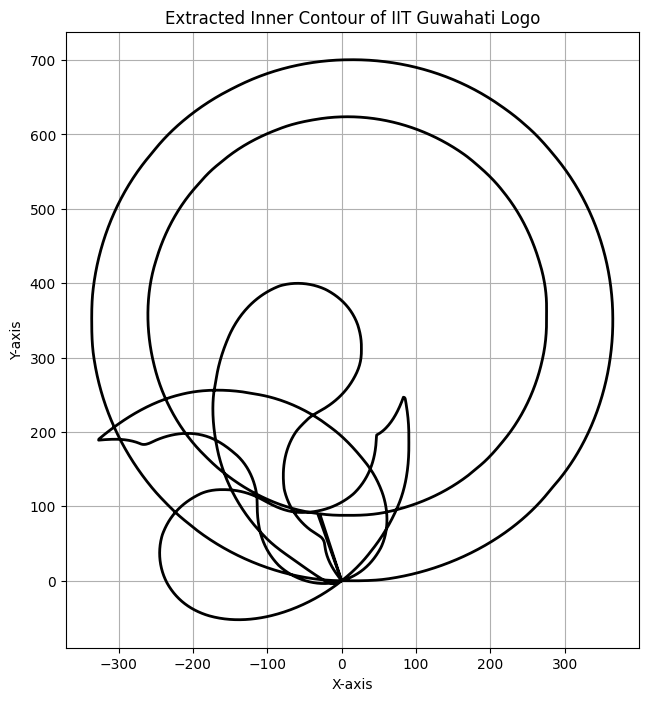

Total extracted contour points: 4000


In [15]:
# Cell 1: Data Extraction and Path Processing (Modified)

import numpy as np
from scipy.integrate import trapezoid
from svgpathtools import svg2paths, Path
import matplotlib.pyplot as plt

# Load SVG file
file_path = 'IITG_Logo.svg'

# Extract vector paths and their attributes
all_paths, attr = svg2paths(file_path)

# Calculate lengths of each path to filter significant parts
lengths = [p.length() for p in all_paths]
print("Lengths of SVG paths:", lengths)

# Select candidate paths (excluding the outermost circle if needed)
cutoff = 1050   # may need fine-tuning for different SVGs
selected = [all_paths[j] for j, L in enumerate(lengths) if L > cutoff and j != 0]

# Merge selected paths into one path
merged = Path(*selected)

# Sample equidistant points along the merged path
n_samples = 4000
param = np.linspace(0, 1, n_samples)
sampled_pts = np.array([merged.point(t) for t in param])

# Represent points as complex array
contour = np.array(sampled_pts)

# Set fundamental period
period = 1.0

# Plot the extracted contour
plt.figure(figsize=(8, 8))
plt.plot(contour.real, contour.imag, color='black', linewidth=2)
plt.title("Extracted Inner Contour of IIT Guwahati Logo")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.gca().set_aspect('equal', adjustable='box')
plt.grid(True)
plt.show()

print(f"Total extracted contour points: {len(contour)}")


In [13]:
# Cell 2: Fourier Coefficient Calculation (Modified)

def fourier_coeffs(signal, time, order, period=None):
    """
    Calculate Fourier series coefficients (complex exponential form).

    Parameters
    ----------
    signal : array_like
        Complex or real-valued signal samples
    time : array_like
        Corresponding time samples
    order : int
        Maximum harmonic index (computes from -order to +order)
    period : float, optional
        Fundamental period of the signal. If not given, inferred from time array.

    Returns
    -------
    coeffs : ndarray
        Fourier coefficients (complex values)
    harmonics : ndarray
        Harmonic indices associated with the coefficients
    """
    if period is None:
        period = time[-1] - time[0]

    harmonics = np.arange(-order, order + 1)
    coeffs = np.zeros(len(harmonics), dtype=complex)

    for idx, n in enumerate(harmonics):
        expr = signal * np.exp(-1j * 2 * np.pi * n * time / period)
        coeffs[idx] = (1.0 / period) * trapezoid(expr, time)

    return coeffs, harmonics


# Choose number of Fourier terms
order = 100

# Compute Fourier coefficients for the complex contour
time_grid = np.linspace(0, period, n_samples)
coeffs, harm = fourier_coeffs(contour, time_grid, order, period=period)

print(f"Computed {len(coeffs)} Fourier coefficients with order={order}.")


Computed 201 Fourier coefficients with order=100.


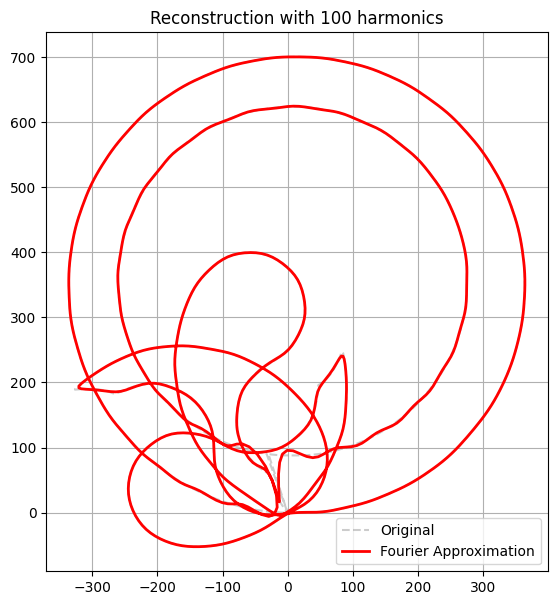

In [17]:

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def synthesize_curve(coeff_array, freq_idx, t_axis, period):
    """
    Generate curve points from Fourier coefficients.

    Parameters
    ----------
    coeff_array : ndarray
        Array of Fourier coefficients
    freq_idx : ndarray
        Corresponding harmonic indices
    t_axis : ndarray
        Time values to evaluate reconstruction
    period : float
        Fundamental period
    """
    curve = np.zeros_like(t_axis, dtype=complex)
    for j, k in enumerate(freq_idx):
        curve += coeff_array[j] * np.exp(1j * 2 * np.pi * k * t_axis / period)
    return curve


def make_fourier_animation(coeffs, harmonics, period, ref_contour, max_order=100, total_frames=200):
    """
    Build an animation showing progressive Fourier reconstruction.

    Parameters
    ----------
    coeffs : ndarray
        Fourier coefficients
    harmonics : ndarray
        Harmonic indices
    period : float
        Period of the signal
    ref_contour : ndarray
        Original shape to compare with
    max_order : int
        Maximum number of harmonics to include
    total_frames : int
        Number of frames in animation
    """
    # Rank coefficients by magnitude
    ranking = np.argsort(np.abs(coeffs))[::-1]
    coeffs_sorted = coeffs[ranking]
    harmonics_sorted = harmonics[ranking]

    # Setup figure
    fig, ax = plt.subplots(figsize=(7, 7))
    ax.set_aspect("equal")
    ax.plot(ref_contour.real, ref_contour.imag, "gray", alpha=0.4, linestyle="--", label="Original")
    line, = ax.plot([], [], "r-", lw=2, label="Fourier Approximation")
    ax.legend()
    ax.grid(True)

    # Pre-generate harmonic counts for each frame
    step = max(1, max_order // total_frames)
    term_counts = list(range(0, max_order + 1, step))
    if term_counts[-1] != max_order:
        term_counts.append(max_order)

    # Frame update function
    def frame_update(frame_idx):
        count = term_counts[frame_idx]

        if count == 0:
            coeff_now = np.array([coeffs[harmonics == 0][0]])
            harm_now = np.array([0])
        else:
            coeff_now = coeffs_sorted[: 2 * count + 1]
            harm_now = harmonics_sorted[: 2 * count + 1]

        t_axis = np.linspace(0, period, 800)
        approx = synthesize_curve(coeff_now, harm_now, t_axis, period)
        line.set_data(approx.real, approx.imag)
        ax.set_title(f"Reconstruction with {count} harmonics")
        return line,

    ani = FuncAnimation(fig, frame_update, frames=len(term_counts), blit=True)
    return ani


# Run animation with rewritten function
animation = make_fourier_animation(coeffs, harm, period, contour, max_order=100)

# Save output
animation.save("fourier_reconstruction_inner.gif", writer="imagemagick", fps=20)

# Display inline
HTML(animation.to_jshtml())
